# Logistic Map

In [1]:
using LinearAlgebra
using Plots
using Colors
using Statistics
using Polynomials
using StatsBase
gr()

Plots.GRBackend()

The equation for the logistic map is as follows: <br> <br>
$X(n+1) = 4 r X(n) (1 - X(n))$ <br> <br>
We define a function that applies this transformation

In [2]:
function logisticMap(x0, r)
    x = 4 * r .* x0 .* (1 .- x0)
    return x
end

logisticMap (generic function with 1 method)

Now we make a loop to apply the logistic map for different $r$ values.

In [6]:
R = [collect(range(0.0, 0.862, length = 10000)); collect(range(0.862, 1.0, length = 10000))] #prepares values for r and increases resolution after the 3rd split point
X = rand(length(R))

for i in 1:10^5
    X = logisticMap(X, R)
end

Logistic map bifurcation plot

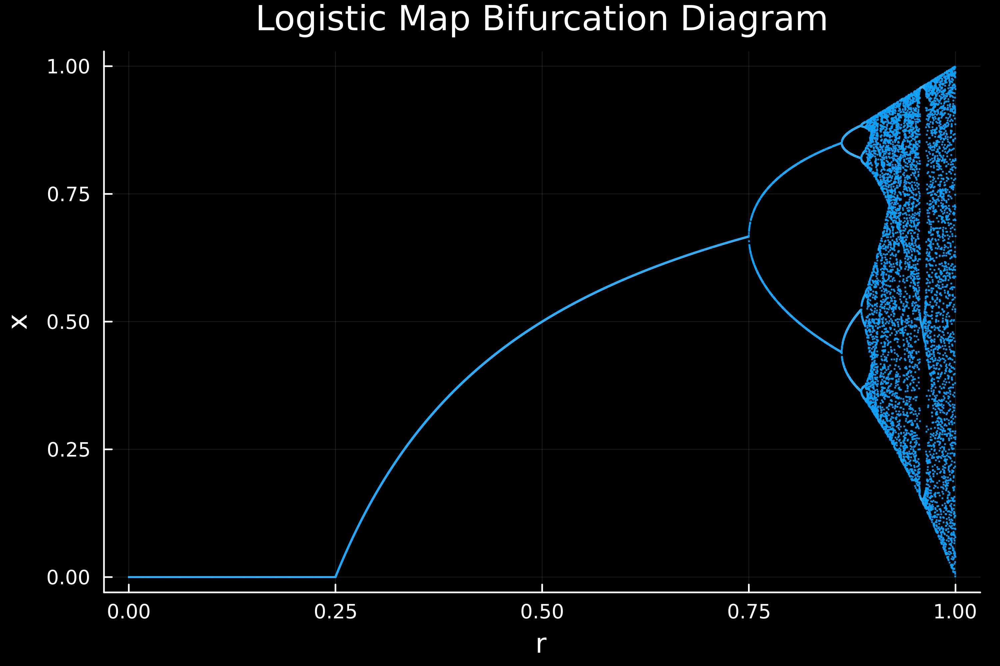

In [7]:
scatter(R, X[:, 1:5:end], title = "Logistic Map Bifurcation Diagram", xlabel = "r", ylabel = "x", background = :black, dpi = 500, legend = false
, markerstrokewidth = 0, markersize = 0.5, marker=:rect)

zoomed in plot with r values ontop

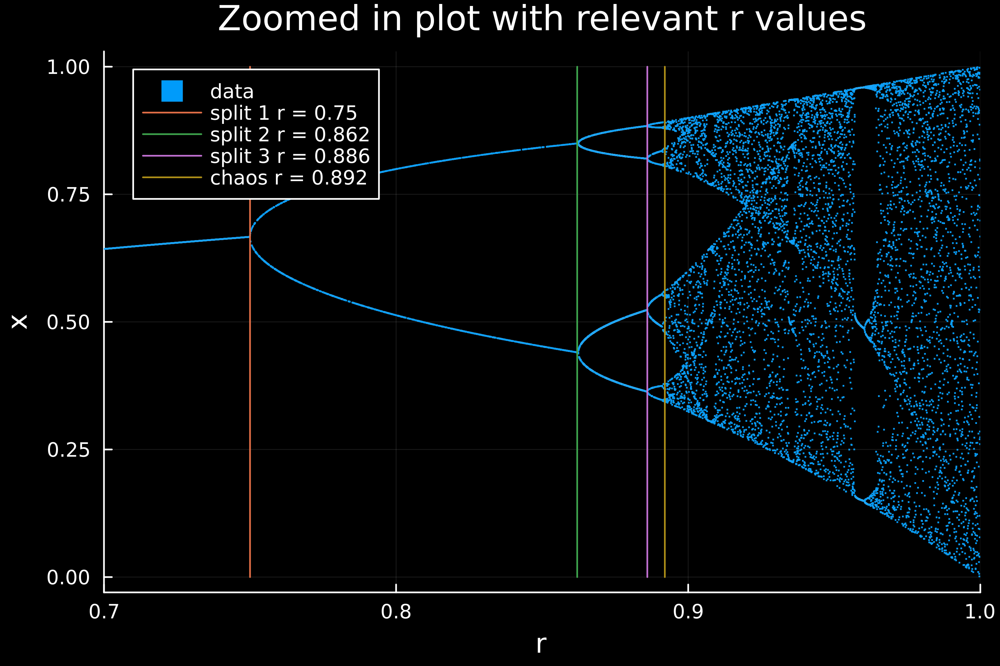

In [8]:
Y = [0, 1]
Xsplit1 = [0.75, 0.75]
Xsplit2 = [0.862, 0.862]
Xsplit3 = [0.886, 0.886]
chaos = [0.892, 0.892]
scatter(R, X, title = "Zoomed in plot with relevant r values", xlabel = "r", ylabel = "x", background = :black, dpi = 500, label = "data"
, markerstrokewidth = 0, markersize = 0.5, marker=:rect, xlims = (0.7, 1))
plot!(Xsplit1, Y, label = "split 1 r = 0.75")
plot!(Xsplit2, Y, label = "split 2 r = 0.862")
plot!(Xsplit3, Y, label = "split 3 r = 0.886")
plot!(chaos, Y, label = "chaos r = 0.892")

## Feigenbaum constants
The first constant $\delta = \frac{a_{n - 1} - a_{n - 2}}{a_n - a_{n - 1}}$ where $a_n$, $a_{n - 1}$ and $a_{n - 2}$ are the bifurcation points into 32, 16 and 8 respectively.

first we regenerate the data but the X array is now a matrix so we can distinguish different bifurcation splitting points

In [45]:
R = [collect(range(0.0, 0.862, length = 10000)); collect(range(0.862, 1.0, length = 20000))] #prepares values for r and increases resolution after the 3rd split point
X = rand(length(R), 100)

for i in 1:10^4
    X = logisticMap(X, R)
end

In [30]:
index8 = findfirst(i -> length(unique(round.(X[i, :], digits = 5))) == 8, 1:length(R))
index16 = findfirst(i -> length(unique(round.(X[i, :], digits = 5))) == 16, 1:length(R))
index32 = findfirst(i -> length(unique(round.(X[i, :], digits = 5))) == 32, 1:length(R))
delta = (R[index16] - R[index8]) / (R[index32] - R[index16])
println("delta = $delta")

delta = 4.463414634146492


The second constant $\alpha$: <br> <br>
$\alpha = \frac{width n}{width n+1}$

In [44]:
index1 = findlast(i -> length(unique(round.(X[i, :], digits = 5))) == 4, 1:length(R)) #finding the last point of each bifurcation
index2 = findlast(i -> length(unique(round.(X[i, :], digits = 5))) == 8, 1:length(R))
X1 = unique(round.(X[index1, :], digits = 5)) #listing the unique values of each nifurcation
X2 = unique(round.(X[index2, :], digits = 5))
X1 = sort(X1) #sorting the unique values
X2 = sort(X2)
deltaX1 = X1[2] - X1[1]
deltaX2 = X2[end - 2] - X2[end - 3]
alpha = deltaX1 / deltaX2
println("alpha = $alpha")

alpha = 1.8157013726146634
